## Cards Detector Using Detectron2

### Install Dependencies

In [1]:
!python -m pip install pyyaml==5.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 1.1 MB/s eta 0:00:00 MB/s eta 0:00:01:01
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp38-cp38-linux_x86_64.whl size=44088 sha256=623c36fd374e9a2bc604a439f8c575c56e8945ee79afc8d92311e349216ac7c1
  Stored in directory: /home/hassi/.cache/pip/wheels/a8/a9/22/0c8737a2e51d239bbad2044d9438b218d6cf77ed9f33ffe7f8
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
1.13.0+cu117 True


In [2]:
#pip install pyyaml==5.1
#import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
#!git clone 'https://github.com/facebookresearch/detectron2'
#dist = distutils.core.run_setup("./detectron2/setup.py")
#!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
#sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-pjvpi02v
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-pjvpi02v
  Resolved https://github.com/facebookresearch/detectron2.git to commit e39b8d0e6a5d17f713b20061b9cfc30f92213a5a
  Preparing metadata (setup.py) ... done


In [3]:
!nvidia-smi

Fri Dec 16 09:03:05 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.60.11    Driver Version: 525.60.11    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  Off  | 00000000:01:00.0 Off |                  N/A |
| N/A   49C    P8     9W /  N/A |      8MiB /  4096MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
import detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

/bin/bash: line 1: nvcc: command not found
torch:  1.13 ; cuda:  cu117
detectron2: 0.6


In [6]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
#from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

### Convert XML to JSON

In [11]:
#from google.colab import drive
#drive.mount('/content/drive')
#%cd /content/drive/MyDrive/Colab Notebooks/DLCVNLP/CV/Pytorch/Detectron2
#!unzip data_detectron2.zip
#!rm data_detectron2.zip
#!unzip train_annotations.zip
#!rm train_annotations.zip
!python voc2coco.py train_annotations data_detectron2/output.json #convertring all the annotations(xml) to single json file

Number of xml files: 290
Success: data_detectron2/output.json


### Regestring Dataset

In [12]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("custom_cards_detector", {}, "./data_detectron2/output.json", "./data_detectron2/train")

In [13]:
sample_metadata = MetadataCatalog.get("custom_cards_detector")
dataset_dicts = DatasetCatalog.get("custom_cards_detector")

WARNING [12/16 09:14:03 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/16 09:14:03 d2.data.datasets.coco]: Loaded 290 images in COCO format from ./data_detectron2/output.json


In [14]:
sample_metadata

namespace(name='custom_cards_detector',
          json_file='./data_detectron2/output.json',
          image_root='./data_detectron2/train',
          evaluator_type='coco',
          thing_classes=['ace', 'jack', 'king', 'nine', 'queen', 'ten'],
          thing_dataset_id_to_contiguous_id={0: 0,
                                             1: 1,
                                             2: 2,
                                             3: 3,
                                             4: 4,
                                             5: 5})

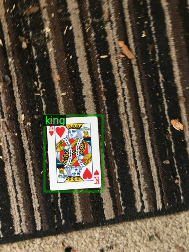

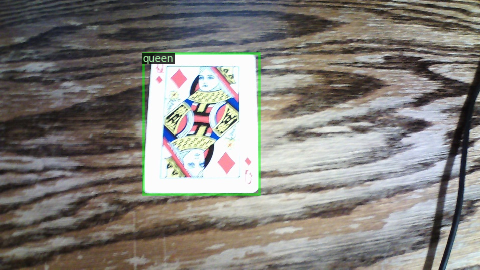

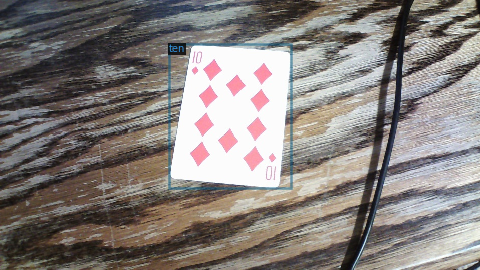

In [11]:
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=sample_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

### Model Training

In [12]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("custom_cards_detector",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 600    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=True)
trainer.train()

[12/15 09:09:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[12/15 09:09:14 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/15 09:09:24 d2.utils.events]:  eta: 0:03:50  iter: 19  total_loss: 2.817  loss_cls: 1.973  loss_box_reg: 0.8556  loss_rpn_cls: 0.003193  loss_rpn_loc: 0.003948  time: 0.3923  data_time: 0.0159  lr: 8.1588e-06  max_mem: 2641M
[12/15 09:09:31 d2.utils.events]:  eta: 0:03:42  iter: 39  total_loss: 2.556  loss_cls: 1.776  loss_box_reg: 0.7866  loss_rpn_cls: 0.005541  loss_rpn_loc: 0.003749  time: 0.3857  data_time: 0.0078  lr: 1.6484e-05  max_mem: 2641M
[12/15 09:09:39 d2.utils.events]:  eta: 0:03:33  iter: 59  total_loss: 2.117  loss_cls: 1.385  loss_box_reg: 0.6659  loss_rpn_cls: 0.00469  loss_rpn_loc: 0.004814  time: 0.3849  data_time: 0.0074  lr: 2.4809e-05  max_mem: 2641M
[12/15 09:09:46 d2.utils.events]:  eta: 0:03:20  iter: 79  total_loss: 1.795  loss_cls: 1.015  loss_box_reg: 0.73  loss_rpn_cls: 0.005297  loss_rpn_loc: 0.004816  time: 0.3829  data_time: 0.0069  lr: 3.3134e-05  max_mem: 2641M
[12/15 09:09:54 d2.utils.events]:  eta: 0:03:13  iter: 99  total_loss: 1.513  loss_cls:

In [13]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

Output hidden; open in https://colab.research.google.com to view.

## Inference & evaluation using the trained model
First, let's create a predictor using the model we just trained:



In [14]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
cfg.DATASETS.TEST = ("custom_cards_detector", )
predictor = DefaultPredictor(cfg)

[12/15 09:16:39 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

Then, we randomly select several samples to visualize the prediction results.

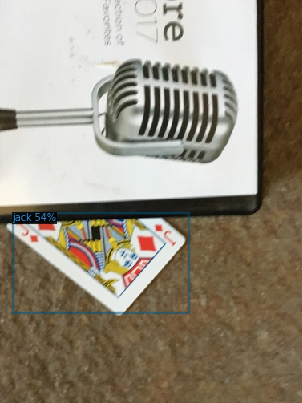

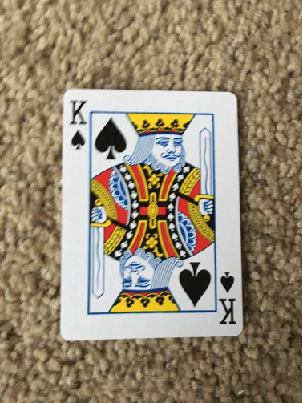

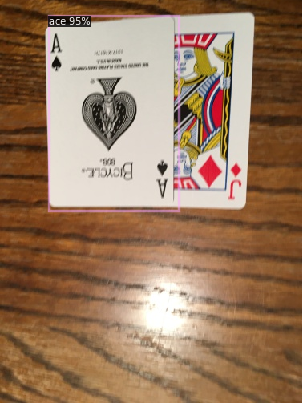

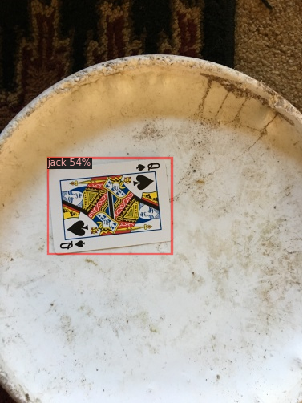

In [16]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(dataset_dicts, 4):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=sample_metadata, 
                   scale=0.8
                   #instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

#### Saving the custom config file

In [17]:
f = open('config.yml', 'w')
f.write(cfg.dump())
f.close()

In [18]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("custom_cards_detector", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "custom_cards_detector")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

WARNING [12/15 09:18:12 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/15 09:18:12 d2.data.datasets.coco]: Loaded 290 images in COCO format from ./data_detectron2/output.json
[12/15 09:18:12 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/15 09:18:12 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[12/15 09:18:12 d2.data.common]: Serializing 290 elements to byte tensors and concatenating them all ...
[12/15 09:18:12 d2.data.common]: Serialized dataset takes 0.07 MiB
[12/15 09:18:12 d2.evaluation.evaluator]: Start inference on 290 batches
[12/15 09:18:13 d2.evaluation.evaluator]: Inference done 11/290. Dataloading: 0.0012 s/iter. Inference: 0.0935 s/iter. Eval: 0.0002 s/iter. Total: 0.0949 s/iter. ETA=0:00:26
[12/15 09:18:18 d2.evaluation.evaluator